# Deep Learning Based Myocardial Cells Detection

Given an Axioscan mice myocardial cell slides scanning with following fluorescent stains:

| Stain  | Labels |
|--------|--------|
| DAPI   | Nuclei |
| AF488-WGA   | Boundary Marker |
| AF555-PDGFRa   | Fibroblast |
| AF647-Ki67   | Proliferation (in nuclei) |
| AF751-CD31   | Endothelial Cells |
| AF594-cTnl   | Cardiomyocytes |

We wish to segment the individual cells (fibroblast, enothelial cells and cardiomyocytes) and classify their cell types.

In [15]:
from aicsimageio import AICSImage
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from skimage import exposure
from cellpose import core, utils, io, models, metrics, plot
from cellpose.plot import *
import SimpleITK as sitk
import pandas as pd
from tqdm import tqdm

In [2]:
channels = {
    "DAPI": "Nuclei",
    "AF488-WGA": "Boundary",
    "AF555-PDGFRa": "Fibroblast",
    "AF647-Ki67": "Proliferation",
    "AF751-CD31": "Endothelial Cells",
    "AF594-cTnl": "Cardiomyocytes"
}

channels_cmap = {
    "DAPI": "Blues",
    "AF488-WGA": "Greys",
    "AF555-PDGFRa": "RdPu",
    "AF647-Ki67": "Reds",
    "AF751-CD31": "Greens",
    "AF594-cTnl": "PuRd"
}

## Data Loading

In [3]:
IMG_PATH = "/media/Data3/Jacky/Data/myocaridal_cells/boundary_marker/no17_FR_lv7_cTnI-594_CD31-750_PDGFRa-555_Ki67-647_WGA-488.czi"

In [4]:
img = AICSImage(IMG_PATH)
img_dask = img.get_image_dask_data("CYX")
img_dask.persist()
img_dask

dask.array<transpose, shape=(6, 11295, 12351), dtype=uint16, chunksize=(6, 3344, 3344), chunktype=numpy.ndarray>

In [5]:
# scaled image
img_dask_scaled = img_dask[:,::10,::10]
img_dask_scaled = img_dask_scaled.compute()

In [6]:
SUBREGION=[5984, 3904, 2800, 1824]

In [7]:
# image subset
img_dask_subset = img_dask[:,SUBREGION[1]:SUBREGION[1]+SUBREGION[3],SUBREGION[0]:SUBREGION[0]+SUBREGION[2]]
img_dask_subset = img_dask_subset.compute()

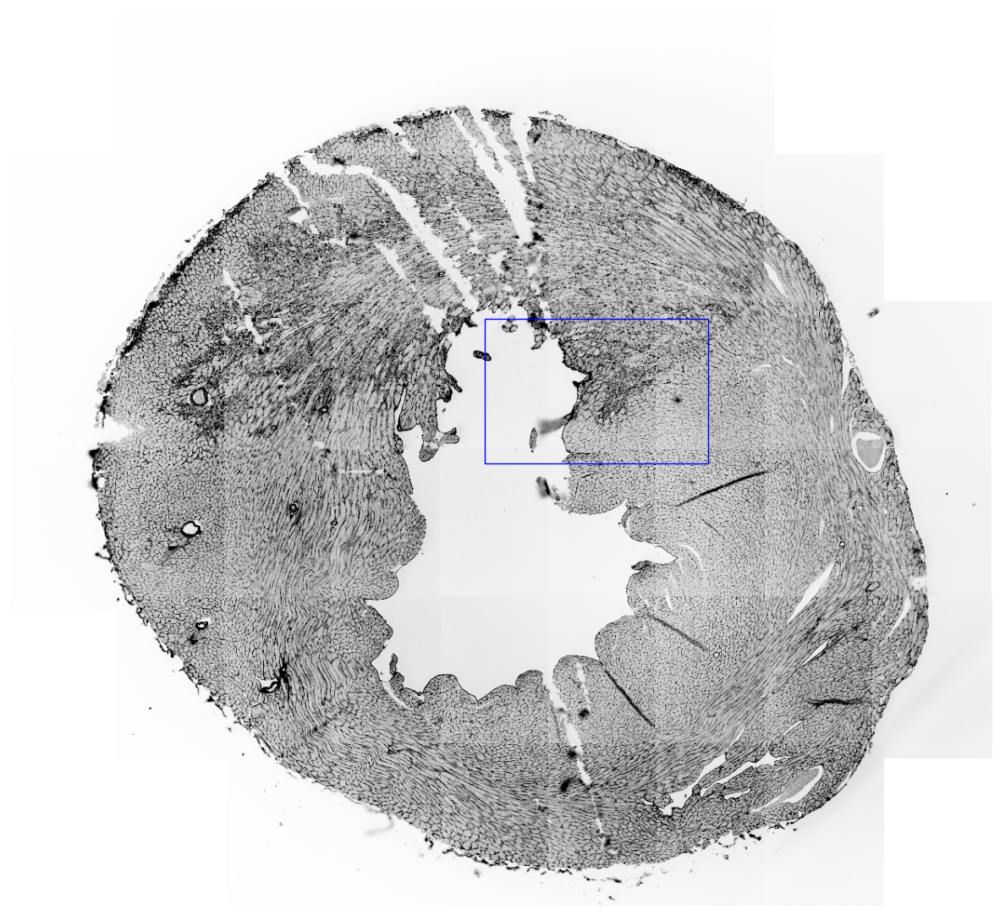

In [8]:
# Create a Rectangle patch
figure, ax = plt.subplots(1,1,figsize=(15,15))
frame = img_dask_scaled[1,:,:]
tail = 1
pl, pu = np.percentile(np.ravel(frame), (tail, 100-tail))
ax.imshow(exposure.rescale_intensity(frame, in_range=(pl, pu),out_range=(0,255)),cmap="Greys")
ax.axis("off")

rect = patches.Rectangle((SUBREGION[0]/10,SUBREGION[1]/10), SUBREGION[2]/10, SUBREGION[3]/10, linewidth=1, edgecolor='b', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

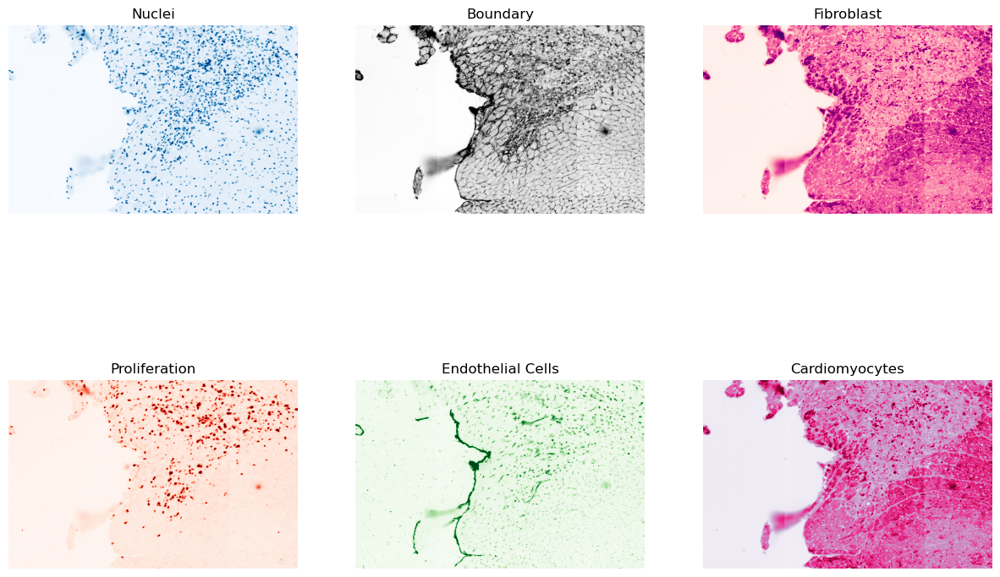

In [9]:
figure, axs = plt.subplots(2,3,figsize=(15,10))
tail = 1

for i, (ch,cell_type) in enumerate(channels.items()):
    ax = axs[i//3,i%3]
    ax.set_title(cell_type)
    ax.axis("off")
    frame = img_dask_subset[i,:,:]
    pl, pu = np.percentile(np.ravel(frame), (tail, 100-tail))
    ax.imshow(exposure.rescale_intensity(frame, in_range=(pl, pu),out_range=(0,255)),cmap=channels_cmap[ch])

## Cell Segmentation

Check CUDA versions and ensure Cellpose works on GPU

In [10]:
!nvcc --version
!nvidia-smi
use_GPU = core.use_gpu()
yn = ['NO', 'YES']
print(f'>>> GPU activated? {yn[use_GPU]}')

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
Wed Jul 12 17:04:42 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.11    Driver Version: 525.60.11    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 4000     Off  | 00000000:65:00.0 Off |                  N/A |
| 30%   30C    P8     5W / 125W |   1318MiB /  8192MiB |      0%      Default |
|                               |      

Run Cellpose 2D with DAPI and Boundary channels

### Cardiomyocytes

![alt text](./imgs/41598_2016_Article_BFsrep23756_Fig1_HTML.webp "Cardiomyocytes")

(A) Cardiomyocytes in long section, DAPI appears in blue, WGA-AF488 appears in green.
(B) Cardiomyocytes in cross-section, DAPI appears in blue, WGA-AF488 appears in grey.

Extracted from *Bensley, Jonathan Guy, et al. "Three-dimensional direct measurement of cardiomyocyte volume, nuclearity, and ploidy in thick histological sections." Scientific reports 6.1 (2016): 23756.*

Cellpose can easily handle the segmentation of this cell type with AF488-WGA and DAPI dual channel labeling.

In [11]:
# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto')

In [12]:
imgs_2D = img_dask_subset[0:3,:,:]

In [17]:
# define CHANNELS to run segmentation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
# channels = [[2,3], [0,0], [0,0]]
channels = [2,1]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

masks, flows, styles, diams = model.eval(imgs_2D.T, diameter=None, flow_threshold=None, channels=channels)

(-0.5, 2799.5, 1823.5, -0.5)

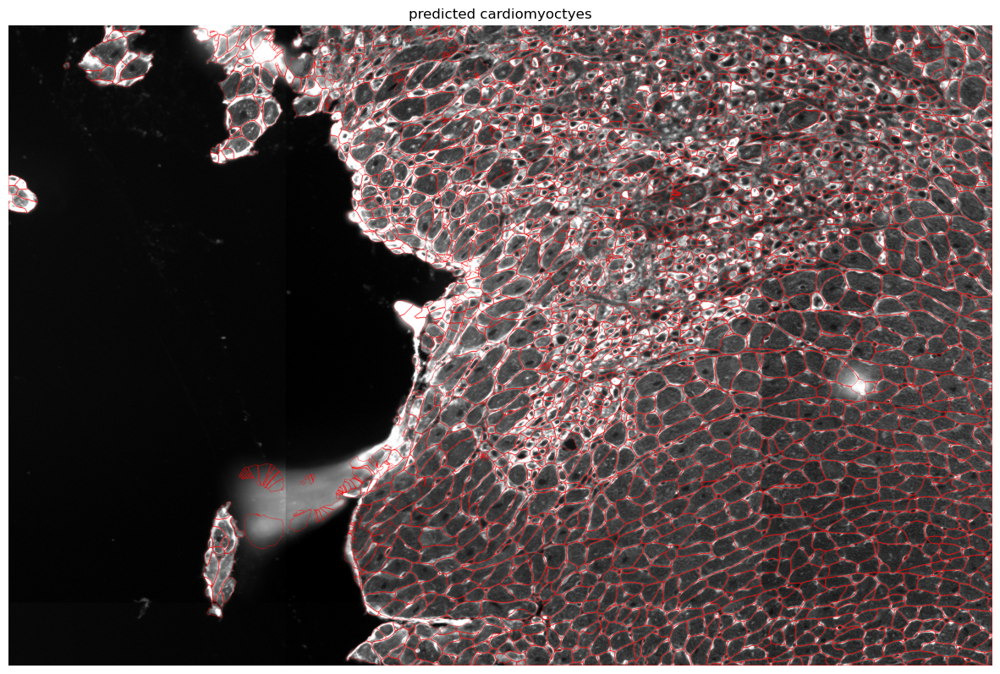

In [18]:
outlines = utils.masks_to_outlines(masks.T)

fig, axs = plt.subplots(1,1,figsize=(15,15))

outX, outY = np.nonzero(outlines)
img0 = image_to_rgb(imgs_2D[1,:,:], channels=[0,0])
imgout= img0.copy()
imgout[outX, outY] = np.array([255,0,0]) # pure red

axs.imshow(imgout)
axs.set_title('predicted cardiomyoctyes')
axs.axis('off')

Most cardiomyoctes are correctly detected, but need to filter out undesirable cells by size and intensity.

In [19]:
img_sitk = sitk.GetImageFromArray(imgs_2D[1,:,:])
mask_sitk = sitk.GetImageFromArray(masks.T)

statFilter = sitk.LabelIntensityStatisticsImageFilter()
statFilter.SetComputeFeretDiameter(True)
statFilter.SetComputePerimeter(True)
statFilter.Execute(mask_sitk,img_sitk)

cell_stats = {
    "label": [],
    "elongation": [],
    "FeretDiameter": [],
    "perimeter": [],
    "pixels": [],
    "roundness": [],
    "mean": [],
    "median": [],
    "variance": []
}

for label in statFilter.GetLabels():
    cell_stats["label"].append(label)
    cell_stats["elongation"].append(statFilter.GetElongation(label))
    cell_stats["FeretDiameter"].append(statFilter.GetFeretDiameter(label))
    cell_stats["perimeter"].append(statFilter.GetPerimeter(label))
    cell_stats["pixels"].append(statFilter.GetNumberOfPixels(label))
    cell_stats["roundness"].append(statFilter.GetRoundness(label))
    cell_stats["mean"].append(statFilter.GetMean(label))
    cell_stats["median"].append(statFilter.GetMedian(label))
    cell_stats["variance"].append(statFilter.GetVariance(label))

cell_stats = pd.DataFrame.from_dict(cell_stats)
cell_stats

,label,elongation,FeretDiameter,perimeter,pixels,roundness,mean,median,variance
0,1,1.186553,38.078866,104.135438,748,0.931016,14318.201872,16376.027344,1.016100e+07
1,2,1.014858,31.240999,94.424806,634,0.945287,11736.094637,11422.324219,4.330016e+06
2,3,2.799702,59.908263,143.533328,878,0.731812,15503.809795,16376.027344,4.415060e+06
3,4,2.282860,73.763134,196.703593,1942,0.794177,12921.837796,12483.832031,9.222201e+06
4,5,1.165729,37.854986,107.737106,756,0.904692,15715.427249,16376.027344,3.515230e+06
...,...,...,...,...,...,...,...,...,...
2739,2740,2.125048,34.058773,83.373415,394,0.843967,6740.314721,6822.457031,1.240098e+06
2740,2741,2.111568,32.202484,82.357979,346,0.800640,7088.179191,6822.457031,3.972862e+06
2741,2742,3.795343,15.811388,37.961846,53,0.679823,5877.207547,5760.949219,2.648979e+05
2742,2743,1.639208,24.351591,65.848269,269,0.882951,6619.565056,6114.785156,3.415648e+06


In [20]:
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

/home/jackyko/mambaforge/envs/myocardial/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/jackyko/mambaforge/envs/myocardial/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/jackyko/mambaforge/envs/myocardial/lib/python3.10/si

Text(0, 0.5, 'umap2')

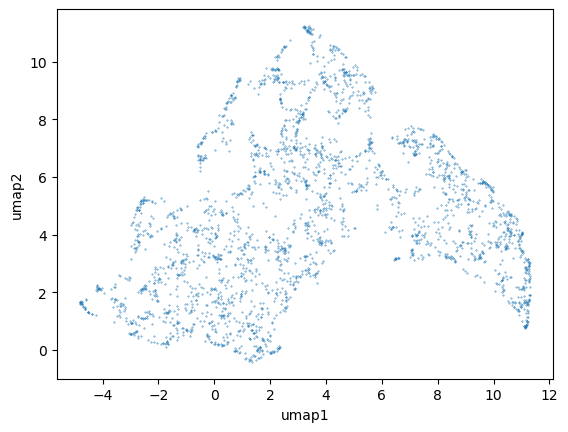

In [21]:
cell_stats_extracted = cell_stats[["FeretDiameter","perimeter","pixels","mean","median","variance"]]
scaler = StandardScaler()
scaler.fit(cell_stats_extracted)
cell_stats_standard = scaler.transform(cell_stats_extracted)

standard_embedding = umap.UMAP(random_state=42).fit_transform(cell_stats_standard)
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], s=0.1)
plt.xlabel("umap1")
plt.ylabel("umap2")


/home/jackyko/mambaforge/envs/myocardial/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,label,elongation,FeretDiameter,perimeter,pixels,roundness,mean,median,variance,class
0,1,1.186553,38.078866,104.135438,748,0.931016,14318.201872,16376.027344,1.016100e+07,1
1,2,1.014858,31.240999,94.424806,634,0.945287,11736.094637,11422.324219,4.330016e+06,1
2,3,2.799702,59.908263,143.533328,878,0.731812,15503.809795,16376.027344,4.415060e+06,1
3,4,2.282860,73.763134,196.703593,1942,0.794177,12921.837796,12483.832031,9.222201e+06,1
4,5,1.165729,37.854986,107.737106,756,0.904692,15715.427249,16376.027344,3.515230e+06,1
...,...,...,...,...,...,...,...,...,...,...
2739,2740,2.125048,34.058773,83.373415,394,0.843967,6740.314721,6822.457031,1.240098e+06,0
2740,2741,2.111568,32.202484,82.357979,346,0.800640,7088.179191,6822.457031,3.972862e+06,0
2741,2742,3.795343,15.811388,37.961846,53,0.679823,5877.207547,5760.949219,2.648979e+05,0
2742,2743,1.639208,24.351591,65.848269,269,0.882951,6619.565056,6114.785156,3.415648e+06,0


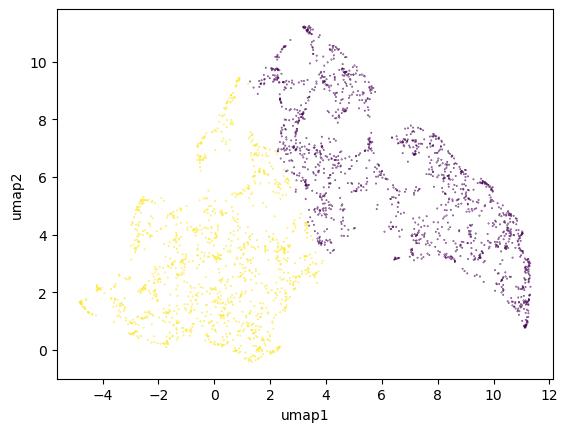

In [22]:
# Perform K-means clustering
kmeans = KMeans(n_clusters=2)
kmeans.fit(standard_embedding)
labels = kmeans.labels_
plt.scatter(standard_embedding[:, 0], standard_embedding[:, 1], c=labels, s=0.1)
plt.xlabel("umap1")
plt.ylabel("umap2")
cell_stats["class"] = labels
cell_stats

100%|██████████| 616/616 [00:01<00:00, 402.80it/s]


(-0.5, 2799.5, 1823.5, -0.5)

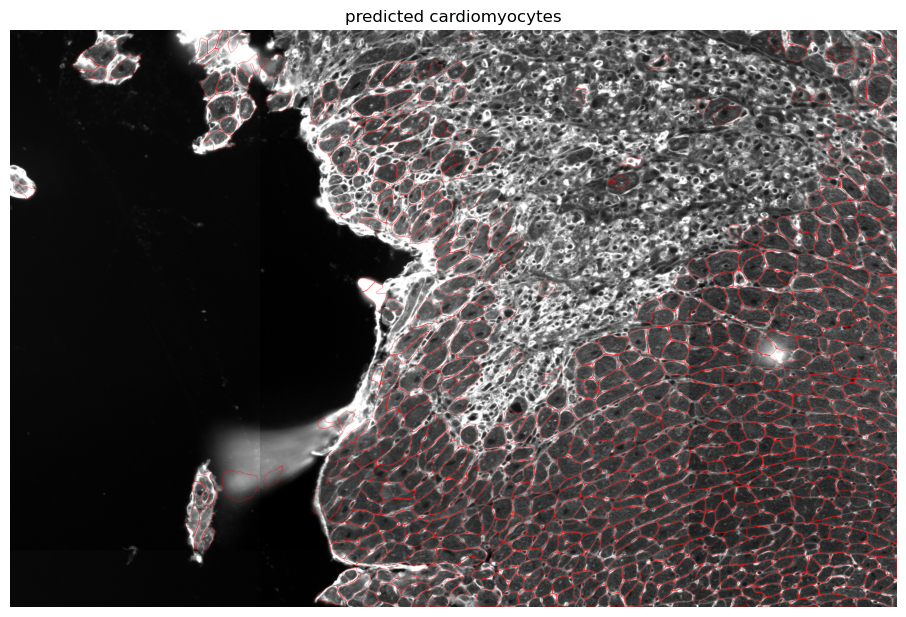

In [23]:
mask_filtered_sitk = sitk.Image(mask_sitk.GetSize(),sitk.sitkUInt16)

# use kmean result
# filtered_labels = cell_stats["label"][(cell_stats["class"]==1) & (cell_stats["pixels"]< 10000)]

# simple area thresholding
filtered_labels = cell_stats["label"][cell_stats["pixels"].between(1500, 10000)]

for label in tqdm(filtered_labels):
    thresholdFilter = sitk.ThresholdImageFilter()
    thresholdFilter.SetLower(label)
    thresholdFilter.SetUpper(label)
    mask_filtered_sitk += thresholdFilter.Execute(mask_sitk)

mask_filtered = sitk.GetArrayFromImage(mask_filtered_sitk)

outlines_cardiomyocytes = utils.masks_to_outlines(mask_filtered)
overlay = mask_overlay(imgs_2D[1,:,:], mask_filtered)

fig, axs = plt.subplots(1,1,figsize=(15,7.5))

outX, outY = np.nonzero(outlines_cardiomyocytes)
img0 = image_to_rgb(imgs_2D[1,:,:], channels=[0,0])
imgout= img0.copy()
imgout[outX, outY] = np.array([255,0,0]) # pure red

axs.imshow(imgout)
axs.set_title('predicted cardiomyocytes')
axs.axis('off')

### Fibroblasts
![alt text](./imgs/nihms161350f3.jpg "Organization and Interactions of Fibroblasts and Myocytes in the Heart")

Confocal micrograph of adult rat heart stained with phalloidin (red), DAPI (blue) and WGA (green). The fibroblasts lie within the endomysial collagen in the extracellular space as previously shown.

Extracted from *Souders, Colby A., Stephanie LK Bowers, and Troy A. Baudino. "Cardiac fibroblast: the renaissance cell." Circulation research 105.12 (2009): 1164-1176.*

In [24]:
fibroblast = exposure.rescale_intensity(img_dask_subset[2,:,:], in_range=(1061, 2301),out_range=(0,255))

In [25]:
masks, flows, styles, diams = model.eval(fibroblast.T, diameter=None, flow_threshold=None, channels=[0,0])

(-0.5, 2799.5, 1823.5, -0.5)

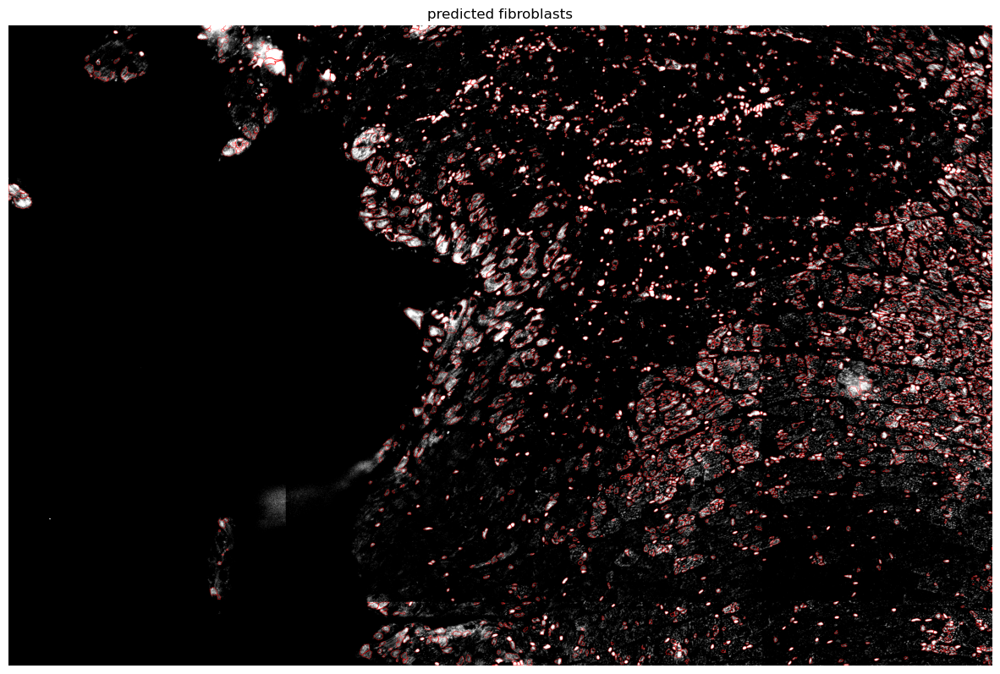

In [26]:
outlines_fibroblasts = utils.masks_to_outlines(masks.T)
overlay = mask_overlay(fibroblast, masks.T)

fig, axs = plt.subplots(1,1,figsize=(15,15))

outX, outY = np.nonzero(outlines_fibroblasts)
img0 = image_to_rgb(fibroblast, channels=[0,0])
imgout= img0.copy()
imgout[outX, outY] = np.array([255,0,0]) # pure red

axs.imshow(imgout)
axs.set_title('predicted fibroblasts')
axs.axis('off')

TODO: Filter out false positive detections by cell features

### Endothelial Cells

![alt text](./imgs/DAPI+CD31_Endothelial_Cells.png "DAPI with CD31 Cardio-Endothelial Cells")

Flourescent slide scans of mice heart stained with DAPI (blue) and AF751-CD31 (green). Red Arrow indicates the extra-tissue debris while yellow arrows illustrates the multiple morphological orientation of the cell.

In [38]:
dapi = img_dask_subset[0,:,:]
boundary = img_dask_subset[1,:,:]
endothelial = exposure.rescale_intensity(img_dask_subset[4,:,:], in_range=(0, 4000),out_range=(0,255))

In [39]:
endothelial_stack = np.stack([dapi,boundary,endothelial],axis=0)

In [46]:
masks, flows, styles, diams = model.eval(endothelial.T, diameter=None, flow_threshold=None, channels=[0,0]) # single channel
# masks, flows, styles, diams = model.eval(endothelial_stack.T, diameter=None, flow_threshold=None, channels=[3,1]) # nuclei + cytoplasm channels

(-0.5, 2799.5, 1823.5, -0.5)

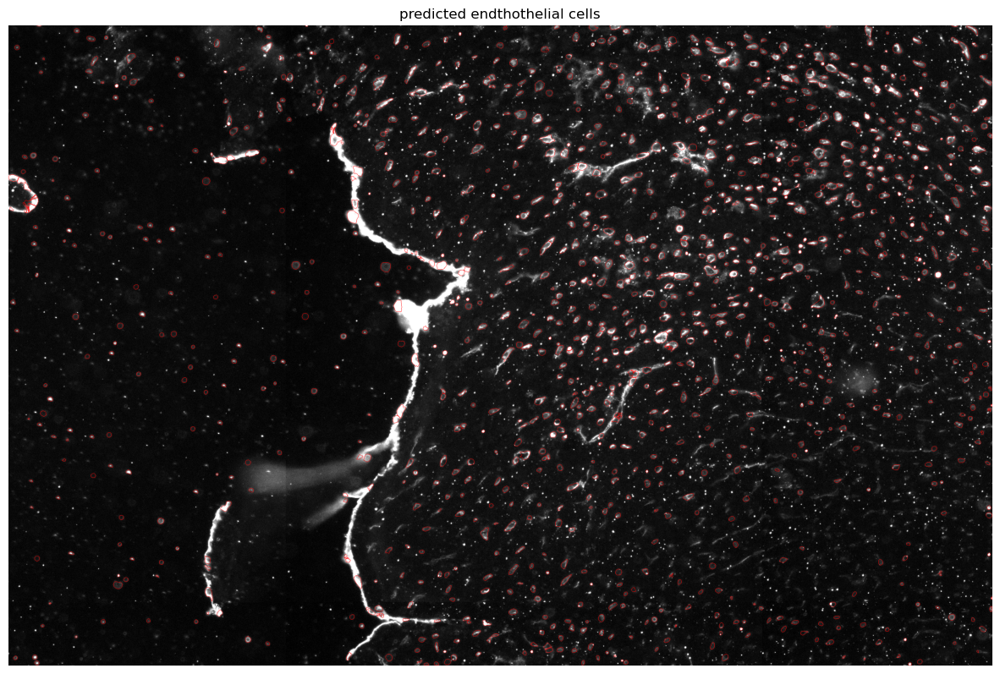

In [47]:
outlines_endothelial = utils.masks_to_outlines(masks.T)
overlay = mask_overlay(endothelial, masks.T)

fig, axs = plt.subplots(1,1,figsize=(15,15))

outX, outY = np.nonzero(outlines_endothelial)
img0 = image_to_rgb(endothelial, channels=[0,0])
imgout= img0.copy()
# imgout = np.zeros_like(endothelial)
# imgout = np.stack([imgout,imgout,imgout],axis=-1)
imgout[outX, outY] = np.array([255,0,0]) # pure red

axs.imshow(imgout)
# axs.imshow(endothelial,cmap="Greens")
# axs.imshow(imgout,alpha=0.7)
axs.set_title('predicted endthothelial cells')
axs.axis('off')

### Merging All Segmentations

(-0.5, 2799.5, 1823.5, -0.5)

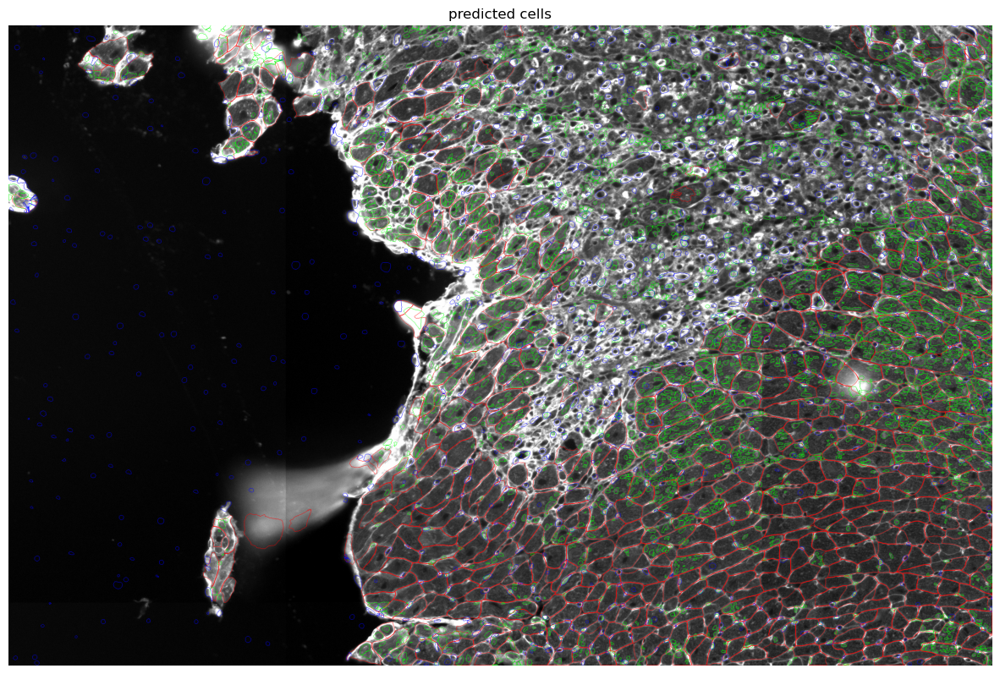

In [48]:
fig, axs = plt.subplots(1,1,figsize=(15,15))

img0 = image_to_rgb(imgs_2D[1,:,:], channels=[0,0])
imgout = img0.copy()
outX, outY = np.nonzero(outlines_cardiomyocytes)
imgout[outX, outY] = np.array([255,0,0]) # pure red

outX, outY = np.nonzero(outlines_fibroblasts)
imgout[outX, outY] = np.array([0,255,0]) # pure green

outX, outY = np.nonzero(outlines_endothelial)
imgout[outX, outY] = np.array([0,0,255]) # pure blue

axs.imshow(imgout)
axs.set_title('predicted cells')
axs.axis('off')